1 case of SDC with core only in all SG bands
1 case of SDC with 5LPI in all SG bands
1 case of SDC+removal diffraction with 5LPI in all SG bands

In [1]:
import glob
import os
import pdb

import astropy
import matplotlib.pyplot as plt
import muse
import numpy as np
import scipy
import xarray as xr
# from muse.inversions.inversions import mass_screen_gcompile
from muse.inversions.models import SVD as svd
from muse.utils.sdc_benchmark import sdc_benchmark as bench
from skglm import Lasso, ElasticNet
from sklearn.linear_model import LassoLars as LassoLars
from sklearn.linear_model import Ridge as Ridge

Process ForkProcess-17:
Process ForkProcess-20:
Process ForkProcess-4:
Process ForkProcess-8:
Process ForkProcess-18:
Process ForkProcess-11:
Process ForkProcess-14:
Process ForkProcess-23:
Process ForkProcess-5:
Process ForkProcess-24:
Process ForkProcess-9:
Process ForkProcess-16:
Process ForkProcess-19:
Process ForkProcess-2:
Process ForkProcess-7:
Process ForkProcess-22:
Process ForkProcess-15:
Process ForkProcess-3:
Process ForkProcess-6:
Process ForkProcess-12:
Process ForkProcess-10:
Process ForkProcess-21:
Process ForkProcess-1:
Process ForkProcess-13:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (mo

In [2]:
from matplotlib import colors
from muse.synthesis.synthesis import add_noise_poisson, add_noise_readout, exposure_time, vdem_synthesis
from muse.instr.utils import sum_lines_per_band
# from muse.inversions.inversions import ci_data_driven_mask

In [3]:
import contextlib
import os
import platform
import time
import warnings
from datetime import datetime
from pathlib import Path

import dask
import numpy as np
import xarray as xr
from dateutil.tz import gettz
from matplotlib import pyplot as plt

from muse import logger
from muse.instr.utils import (
    ci2sg_response_format,
    convert_resp2muse_resp,
    create_resp_func,
    create_resp_line_list,
    sum_lines_per_band,
    sum_lines_slits_per_band,
)
from muse.inversions.inversions import mask_response, vdem_solve
from muse.synthesis.synthesis import (
    add_noise_poisson,
    add_noise_readout,
    calc_error,
    exposure_time,
    ph2dn,
    transform_resp_units,
    vdem_synthesis,
)
from muse.transforms.transforms import muse_fov, reshape_rs2x, reshape_x2rs
from muse.utils.fitting import gaussian_fitting_analysis, masker
from muse.utils.forward_pipeline import get_muse_version
from muse.utils.miscellaneous import (
    get_moment_limits,
    get_outliers_newer,
    plot_nine_conts,
    plot_slit_cont_maps,
    plot_with_chisquare,
)
from muse.utils.utils import confusion_masked, read_response, sub_contaminants

def _read_and_concat_responses(resp_path, names, logT, vdop, slit, logTmethod="nearest", vdopmethod="linear"):
    """
    Read a list of response zarrs in parallel and concat along 'line'.
    """
    with dask.config.set(**{"array.slicing.split_large_chunks": False}):
        resp_list = [
            read_response(
                str(Path(resp_path) / fname), logT=logT, vdop=vdop, slit=slit, logTmethod=logTmethod, vdopmethod=vdopmethod
            ).compute()
            for fname in names
        ]
    return xr.concat(resp_list, dim="line")

In [4]:
model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr"
resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/"
resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/"
FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr"
syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/"
effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/"
effect_area_108="effective_area_band_108_JMS_2024-10-31.zarr"
effect_area_171="effective_area_band_171_JMS_2024-10-31.zarr"
effect_area_284="effective_area_band_284_JMS_2024-10-31.zarr"
obs_filename_ci=None
obs_filename_sg=None
gt_filename_sg=None
serial_gfat=False
run_SDC=True
serial_SDC=False
run_mask=None  # ["gt_vdem" "redundant" "intensity" "data_driven"]
redundant_mask=None
velbin_inv=None
tgbin_inv=None
ntgbin_inv=None
rotate=False
saturation=None
KEYS=None  # [None"middle""bottom" "all"]
target=None  # ["QS""AR""FL"]
jump_pix=None  # [1010] Jump in y-axis and t-step
logT=None
vdop=None
logT_inv=None
vdop_inv=None
nslits=35
model=None
model2=None
data_driven_mask_model=None
data_driven_mask_keyword=None
exp_time=0.1
noise=False
noise_seed=123456789
readoutnoise=2.24
compression: int = 1
npix=2
max_vel=50
velocity_range=50
velocity_range_gt=None
velocity_range_guided=None
intensity_scaling=None  # ["noise" "no_noise" None]
response_info="0.390/0.780 A"
line=None
savefigs=True
savepath="./"
save_id=""
savelogfile="sdc_benchmark.json"
logger=logger
save_output=False
save_output_netcdf=False
author="JMS"
appendlog=None
disable_pbar=False
run_cont_id=False
dens_eff=1e9  # The VDEM could be expanded to include density dependence (and the response function)
pres_eff=3e15  # The VDEM could be expanded to include density dependence (and the response function)
lgtgmin_eff=4.8
int_cont_ratio=1e2
main_lines_cont=None
n_cont_top=20
cuda_device=3
pad_value=3
response_scaling=None  # "auto" None
unmask_outliers=True
randomizeSVD=True
muse_fov_mode="wrap"
thresholds_ph=None
thresholds_dn=None
passbands_to_solve=None

In [5]:
dpth_vdem_m_flare="/net/triad/Volumes/Space/MUSE_GCP/muse_vdems/vdems_models/m_flare_muram_trac/"

FeXIX_108_resp="respfunc_108_fe_19_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
FeXXI_108_resp="respfunc_108_fe_21_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_108_resp="respfunc_108-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31_VU_2025-02-12.zarr"
FeIX_171_resp="respfunc_171_fe_9_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_171_resp="respfunc_171-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
FeXV_284_resp="respfunc_284_fe_15_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31.zarr"
contam_284_resp="respfunc_284-L_nslits35_sep390sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2025-03-28.zarr"
ci_195_resp="respfunc_ci_cut_195_sun_coronal_2021_chianti_coatingOptixFab_pres3e+15_JMS_2024-10-31a.zarr"
dpth_resp="/net/triad/Volumes/Space/MUSE_GCP/muse_response_function/Base_line/"

In [6]:
base_path = '/Users/khcho/MUSE/diffraction/555LPI_noise_test'
os.chdir(base_path)
import sys
sys.path.append(base_path)
import importlib



In [7]:
## parameters

model_path=dpth_vdem_m_flare
model_name='muse_vdem_m-flare-muram_los2_trac_fixedvdop_JMS_2May2025_555806.zarr'
resp_path_sg=dpth_resp+'response_functions_with_slits/'
resp_path_ci=dpth_resp+'response_functions_CI/'
# resp_path_ci=None 
FeXIX_108_resp=FeXIX_108_resp
FeXXI_108_resp=FeXXI_108_resp
contam_108_resp=contam_108_resp
FeIX_171_resp=FeIX_171_resp
contam_171_resp=contam_171_resp
FeXV_284_resp=FeXV_284_resp
contam_284_resp=contam_284_resp
ci_195_resp=ci_195_resp
# ci_195_resp=None
#velbin_inv=5 #[5,10,15,20,30]
vdop = np.arange(-500, 510, 10)   #controls VDEM and Response Functions (no noise exp.)
vdop_inv = np.arange(-500, 510, 10) #controls only Response Functions in the inversions (fixed no noise exp.)

velocity_range = 80 
velocity_range_guided = 400 

run_SDC=True
serial_SDC=False
exp_time=0.6    #noise exp: 0.1, 0.6, 1.8 s
obs_filename_ci=None
obs_filename_sg=base_path+'/specsum_only_core.zarr'
gt_filename_sg=base_path+'/specsum_gt.zarr'
syn_path="./"
KEYS=['all']
# jump_pix = [16 16] 
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
intensity_scaling="no_noise"
# model = Lasso(alpha=1e-3, positive=True, fit_intercept=False, max_epochs=500) 

alpha_L1 = 1e-1
alpha_L2 = 1e-3
l1_ratio = 1/(2*alpha_L2/alpha_L1+1)
alpha = 2*alpha_L2 + alpha_L1
model = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_epochs=500, positive=True, fit_intercept=False)

run_mask = None 
savefigs=True
savepath=base_path
noise = True   #noise exp
save_output = True
save_id=f'only_core' 


In [8]:
import astropy.units as u
import numpy as np
import xarray as xr

from muse.utils.utils import add_history
from muse import logger
from muse.instr.utils import filter_mesh_parameters
from muse.transforms.transforms import reshape_rs2x
from muse.utils.utils import add_history
from muse.variables import CHANNEL_MAP

def match_size(img, psf):
    imgy, imgx = img.shape
    psfy, psfx = psf.shape
    rx = np.ceil((imgx + psfx - 1)/imgx*0.5)*2
    ry = np.ceil((imgy + psfy - 1)/imgy*0.5)*2
    nx = int(imgx*rx)
    ny = int(imgy*ry)
    new_img = np.zeros((ny, nx))
    for j in range(nx):
        for i in range(ny):
            new_img[imgy*j:imgy*(j+1), imgx*i:imgx*(i+1)] = img[::(-1)**j, ::(-1)**i]
    new_psf = np.zeros((ny, nx))
    new_psf[:psfy, :psfx] = psf    
    return new_img, new_psf

def fftconv(img, psf, crop=True):
    imgy, imgx = img.shape
    psfy, psfx = psf.shape
    new_img, new_psf = match_size(img, psf)
    conv = np.real(np.fft.ifft2(np.fft.fft2(new_img)*np.fft.fft2(new_psf)))
    if crop:
        conv = conv[psfy//2:psfy//2+imgy, psfx//2:psfx//2+imgx]
    return conv

def convolve_model_psf(
    spectrum,
    model,
    *,
    fixed_psf_per_channel=False,
    band=(284,),
    inplace=False,
    **kwargs,
):
    """
    Given an input spectrum with coordinates x, y (spatial) and wavelength,
    convolve the flux variable at each wavelength slice with the instrument
    point spread function.

    Parameters
    ----------
    spectrum : xarray.Dataset
        Dataset with flux variable on x, y, wavelength, ... coordinates
    model: func
        PSF Model to use. The args and kwargs are passed to the model
        e.g., model = gausslobes
    fixed_psf_per_channel: bool, optional
        Use a constant PSF in each wavelength channel, by default False
    inplace: bool, optional
        Do inplace modification of spectrum, or return a copy, by default False

    Returns
    -------
    xarray.Dataset
        Dataset with the same quantities as input.
    """
    output = spectrum.copy(deep=not inplace)
    assert "flux" in output.variables
    if "x" not in output.coords:
        output = reshape_rs2x(output)
    assert "y" in output.coords
    assert "SG_wvl" in output
    assert "band" in output.coords
    if "band" not in output.dims:
        output = output.swap_dims({"line": "band"})
    output = output.transpose("x", "y", ...)
    for a_band in band:
        if "band" not in output.dims:
            output = output.swap_dims({"line": "band"})
        lineflux = output.sel(band=a_band)
        if "line" in lineflux.coords and "band" in lineflux.dims:
            lineflux = lineflux.swap_dims({"band": "line"})
            if "band" in output.dims:
                output = output.swap_dims({"band": "line"})
            for iline in lineflux.line:
                lineflux_2 = lineflux.sel(line=iline)

                logger.debug(f"Convolving band: {a_band}")
                if fixed_psf_per_channel:
                    # Use a gausslobes PSF for each channel (i.e. ignore wavelength dependence)
                    pp0 = model(wavelength=a_band * u.AA, **kwargs)
                if "time" in lineflux_2.dims:
                    for i, w in enumerate(tqdm(lineflux_2.SG_wvl.data)):
                        if np.isnan(w):
                            continue
                        if not fixed_psf_per_channel:
                            pp0 = model(wavelength=w * u.AA, **kwargs)
                        for iitime, itime in enumerate(lineflux_2.time):
                            obj = lineflux_2.flux.isel(SG_xpixel=i, time=iitime).data
                            if obj.max() > 0:
                                output["flux"].loc[{"line": iline, "SG_xpixel": i, "time": itime}] = fftconv(
                                    obj,
                                    pp0,
                                )
                else:
                    for i, w in enumerate(tqdm(lineflux_2.SG_wvl.data)):
                        if np.isnan(w):
                            continue
                        if not fixed_psf_per_channel:
                            pp0 = model(wavelength=w * u.AA, **kwargs)

                        obj = lineflux_2.flux.isel(SG_xpixel=i).data
                        if obj.max() > 0:
                            output["flux"].loc[{"line": iline, "SG_xpixel": i}] = fftconv(obj, pp0)

        else:
            logger.debug(f"Convolving band: {a_band}")
            if fixed_psf_per_channel:
                # Use a gausslobes PSF for each channel (i.e. ignore wavelength dependence)
                pp0 = model(wavelength=a_band * u.AA, **kwargs)
            for i, w in enumerate(lineflux.SG_wvl.data):
                if np.isnan(w):
                    continue
                if not fixed_psf_per_channel:
                    pp0 = model(wavelength=w * u.AA, **kwargs)
                if "time" in lineflux.dims:
                    for iitime, itime in enumerate(lineflux.time):
                        obj = lineflux.isel(SG_xpixel=i, time=iitime).data
                        if obj.max() > 0:
                            output["flux"].loc[{"band": a_band, "SG_xpixel": i, "time": itime}] = fftconv(
                                obj,
                                pp0,
                            )
                else:
                    obj = lineflux.flux.isel(SG_xpixel=i).data
                    if obj.max() > 0:
                        output["flux"].loc[{"band": a_band, "SG_xpixel": i}] = fftconv(obj, pp0)
    if "band" in spectrum.dims and "line" in output.dims:
        output = output.swap_dims({"line": "band"})
    add_history(output, locals(), convolve_model_psf)
    return output

In [9]:
# kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 70, "fwhm": 0.5, "transmission": 0.81}
kargs={"oversample_x": 3, "slit_dim": 404, "lpi": 5, "fwhm": 0.5, "transmission": 0.97}
if True:
    sg_files = [
            FeXIX_108_resp,
            FeXXI_108_resp,
            contam_108_resp,
            FeIX_171_resp,
            contam_171_resp,
            FeXV_284_resp,
            contam_284_resp,
        ]
    logTmethod = "nearest"  # Use nearest method for the temperature
    slit = np.arange(nslits)
    response = _read_and_concat_responses(resp_path_sg, sg_files, logT, vdop, slit, logTmethod)
    response = response.assign_coords(band=("line", [108, 108, 108, 171, 171, 284, 284]))
    response = response.compute()
    logT = response.logT
    vdop = response.vdop
    
    ci = xr.open_zarr(Path(resp_path_ci) / ci_195_resp).compute()
    ci = ci.drop_vars("effective_area").sum("SG_xpixel")
    response_ci_xarray = ci2sg_response_format(ci, response.isel(line=[0]).compute()).sel(
            logT=response.logT, vdop=response.vdop, method="nearest"
        )
    response_ci = response_ci_xarray.compute()
    if "line_wvl" in response.coords and "line_wvl" not in response_ci.coords:
        # Add 'line_wvl' as a coordinate (assign appropriate values)
        response_ci = response_ci.assign_coords(line_wvl=response_ci.line)

    response = xr.concat([response, response_ci], dim="line")
    del response_ci, response_ci_xarray

    response["SG_resp"] = response.SG_resp.fillna(0.0)
    response.to_zarr(base_path+'/response.zarr', mode='w')


    vdem_muse_fov = xr.open_dataset(str(Path(model_path) / model_name)).compute()
    vdem_muse_fov = muse_fov(vdem_muse_fov, rotate=None, mode=muse_fov_mode)
    vdem_muse_fov_rs = reshape_x2rs(vdem_muse_fov)
    vdem_muse_fov_rs = vdem_muse_fov_rs.sel(logT=response.logT, vdop=response.vdop, drop=True, method="nearest")
    # vdem_muse_fov_rs = vdem_muse_fov_rs.interp(vdop=vdop).fillna(0.0)
    
    spectrum_synthesis = vdem_synthesis(
                         vdem_muse_fov_rs,
                         response,
                         sum_over=["logT", "vdop"],
    )
    
    from muse.instr.psf import convolve_model_psf
    from muse.instr.utils import sum_lines_per_band, sum_lines_slits_per_band
    from muse.synthesis.synthesis import vdem_syn_join_slits_wvl
    from muse.instr.gausslobes import gausslobes
    from muse.transforms.transforms import muse_interp_xyw2rssg
    
    spec_gt = exposure_time(spectrum_synthesis, exp_time=exp_time)
    spec_gt.to_zarr(base_path+'/specsum_gt.zarr', mode='w')
    spec_gt_noise = add_noise_poisson(spec_gt, response=response, seed=noise_seed)
    spec_gt_noise = ph2dn(spec_gt_noise, response=response)
    spec_gt_noise = add_noise_readout(spec_gt_noise, response=response, 
                                      compression=compression, seed=noise_seed)
    spec_gt_noise.to_zarr(base_path+'/specsum_gt_noise.zarr', mode='w')
    
    spec_merge_line = vdem_syn_join_slits_wvl(response, vdem_muse_fov_rs, line=response.line[[0, 3, 5]])
    spec_merge_line['gain'] = xr.DataArray([10, 10, 10], coords={'band':spec_merge_line.band}, dims='band')
    
    spec_with_diff = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, band=[108,171,284])
    muse_spec_diff, resp = muse_interp_xyw2rssg(spec_with_diff,response, line=response.line[[0, 3, 5]])
    muse_spec_diff['gain'] = xr.DataArray([10, 10, 10], coords={'band':muse_spec_diff.band}, dims='band')

    specsum_diff = exposure_time(muse_spec_diff, exp_time=exp_time)
    specsum_diff = add_noise_poisson(specsum_diff, response=response, seed=noise_seed)
    specsum_diff = ph2dn(specsum_diff, response)
    specsum_diff = sum_lines_slits_per_band(specsum_diff)
    specsum_diff = add_noise_readout(specsum_diff, response=response, seed=noise_seed)
    specsum_diff = specsum_diff.swap_dims({'line':'band'})
    specsum_diff.to_zarr(base_path+'/specsum_diff.zarr', mode='w')
    
    spec_only_core = convolve_model_psf(spec_merge_line,model=gausslobes,**kargs, band=[108,171,284],only_core=[True]*3)
    muse_spec_only_core, resp = muse_interp_xyw2rssg(spec_only_core,response, line=response.line[[0, 3, 5]])
    muse_spec_only_core['gain'] = xr.DataArray([10, 10, 10], coords={'band':muse_spec_only_core.band}, dims='band')
    
    specsum_only_core = exposure_time(muse_spec_only_core, exp_time=exp_time)
    specsum_only_core = add_noise_poisson(specsum_only_core, response=response, seed=noise_seed)
    specsum_only_core = ph2dn(specsum_only_core, response)
    specsum_only_core = sum_lines_slits_per_band(specsum_only_core)
    specsum_only_core = add_noise_readout(specsum_only_core, response=response, seed=noise_seed)
    specsum_only_core = specsum_only_core.swap_dims({'line':'band'})
    specsum_only_core.to_zarr(base_path+'/specsum_only_core.zarr', mode='w')

    spec_slit_only_core = exposure_time(muse_spec_only_core, exp_time=exp_time)
    spec_slit_only_core = add_noise_poisson(spec_slit_only_core, response=response, seed=noise_seed)
    spec_slit_only_core = ph2dn(spec_slit_only_core, response)
    # spec_slit_only_core = add_noise_readout(spec_slit_only_core, response=response, seed=noise_seed)

    spec_slit_only_core = spec_slit_only_core.swap_dims({'line':'band'})
    for iband in spec_slit_only_core.band:
        for islit in spec_slit_only_core.slit:
            spec_slit_only_core['flux'].loc[{'slit':islit, 'band':iband}] \
                += specsum_only_core.readout_noise.sel(band=iband)
    

    spec_slit_only_core.to_zarr(base_path+'/spec_slit_only_core.zarr', mode='w')

else: 
    response = xr.open_zarr(base_path+'/response.zarr').compute()
    spec_gt = xr.open_zarr(base_path+'/specsum_gt.zarr').compute()
    specsum_diff = xr.open_zarr(base_path+'/specsum_diff.zarr').compute()
    specsum_only_core = xr.open_zarr(base_path+'/specsum_only_core.zarr').compute()
    spec_slit_only_core = xr.open_zarr(base_path+'/spec_slit_only_core.zarr').compute()
    spec_gt_noise = xr.open_zarr(base_path+'/specsum_gt_noise.zarr').compute()

2025-08-13 16:33:02.477 | INFO     | muse.transforms.transforms:muse_fov:71 - vdem has already the MUSE pixel size


In [10]:
ci_obs_spec = spec_gt_noise.sum('slit').swap_dims({'line':'band'}).sel(band=195).drop_vars('line')

In [11]:
specsum_diff = xr.concat([specsum_diff, ci_obs_spec], dim="band")
specsum_only_core = xr.concat([specsum_only_core, ci_obs_spec], dim="band")

In [12]:
response = ph2dn(response, response)

In [13]:
response.interp(vdop=vdop_inv).fillna(0.0)
vdop = vdop_inv
respsum = sum_lines_per_band(response)

2025-08-13 16:49:03.033 | INFO     | muse.instr.utils:sum_lines_per_band:1287 - Swapping lines with band was required


In [14]:
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import (
    remove_diffraction_mono, 
    create_xyw_cube, 
    diffraction_removal_from_cube,
    create_spectrum_from_cube)


In [15]:
if True:
    spec_diff_removed = remove_diffraction_mono(
        specsum_diff, response, gausslobes_kwarg=kargs, band=specsum_diff.band[:3])

    spec_diff_removed.to_zarr(base_path+'/spec_diff_removed', mode='w')
else:
    spec_diff_removed = xr.open_zarr(base_path+'/spec_diff_removed').compute()

In [16]:
if True:
    mom_diff_removed = gaussian_fitting_analysis(
        spec_diff_removed,
        response,
        line_band_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_diff_removed.to_zarr(base_path+'/mom_diff_removed', mode='w')
else:
    mom_diff_removed = xr.open_zarr(base_path+'/mom_diff_removed').compute()

In [17]:
if True:
    mom_only_core = gaussian_fitting_analysis(
        specsum_only_core,
        response,
        line_band_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_only_core.to_zarr(base_path+'/mom_only_core', mode='w')
else:
    mom_only_core = xr.open_zarr(base_path+'/mom_only_core').compute()

In [18]:
if True:
    mom_diff = gaussian_fitting_analysis(
        specsum_diff,
        response,
        line_band_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
    mom_diff.to_zarr(base_path+'/mom_diff', mode='w')
else:
    mom_diff = xr.open_zarr(base_path+'/mom_diff').compute()

In [19]:
if True:
    mom_gt = gaussian_fitting_analysis(
        spec_gt,
        response,
        line_band_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
    mom_gt.to_zarr(base_path+'/mom_gt', mode='w')
else:
    mom_gt = xr.open_zarr(base_path+'/mom_gt').compute()

In [20]:
if True:
    mom_slit_only_core = gaussian_fitting_analysis(
        spec_slit_only_core,
        response,
        line_band_key=line,
        kwargs_obs={"npix": npix, "velocity_range": velocity_range_gt, "serial": serial_gfat})
    mom_slit_only_core.to_zarr(base_path+'/mom_slit_only_core', mode='w')
else:
    mom_slit_only_core = xr.open_zarr(base_path+'/mom_slit_only_core').compute()

In [21]:
pn = colors.PowerNorm(0.3)

In [22]:
from muse.instr.detect_sidelobes import gl_dist
gl_dist(specsum_diff.line_wvl, lpi=5, arcsec=True)

<xarray.DataArray 'line_wvl' (band: 4)>
array([0.43995715, 0.69461298, 1.15379579, 0.79176451])
Coordinates:
    line_wvl  (band) float64 108.4 171.1 284.2 195.0
    gain      (band) int64 10 10 10 10
  * band      (band) int64 108 171 284 195

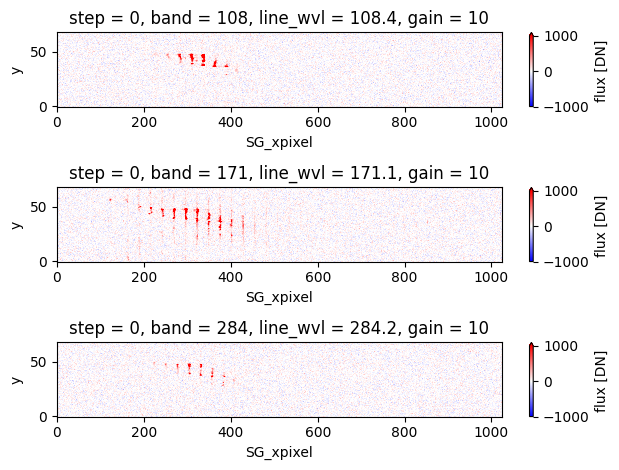

In [110]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_diff - spec_slit_only_core.sum('slit')).flux.isel(band=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

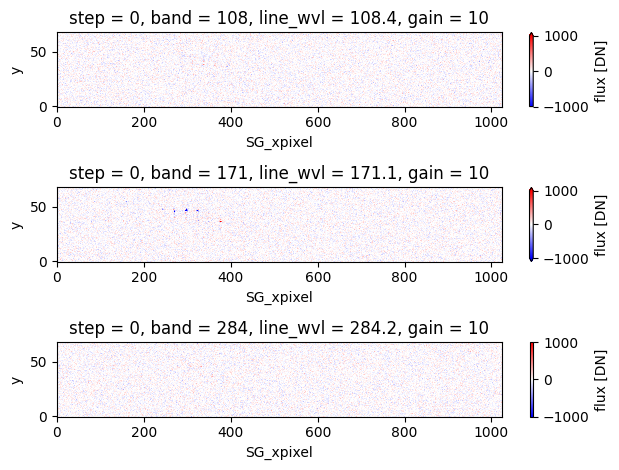

In [111]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (spec_diff_removed - spec_slit_only_core.sum('slit')).flux.isel(band=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

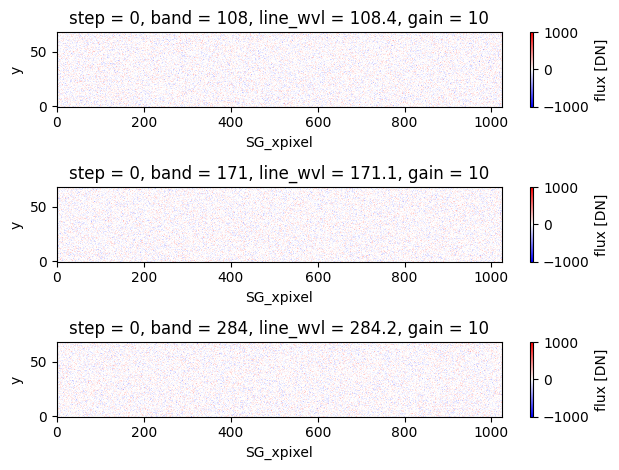

In [112]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_only_core - spec_slit_only_core.sum('slit')).flux.isel(band=i, step=0)\
        .plot(vmin=-1e3, vmax=1e3, cmap='bwr', ax=ax[i])
plt.tight_layout()    

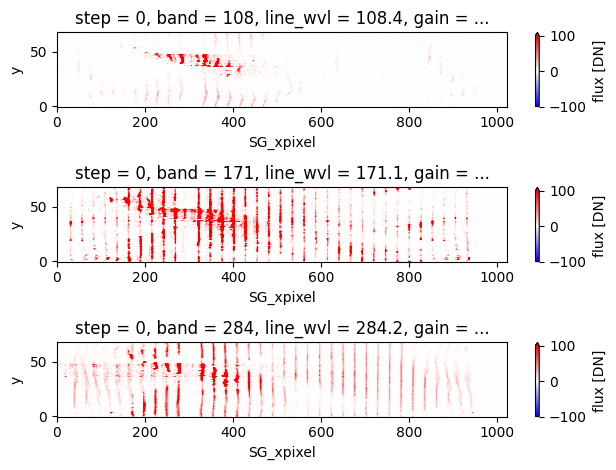

In [33]:
fig, ax = plt.subplots(3, 1)
for i in range(3):
    (specsum_only_core - spec_slit_only_core.isel(slit=10)).flux.isel(band=i, step=0)\
        .plot(vmin=-1e2, vmax=1e2, cmap='bwr', ax=ax[i])
plt.tight_layout()    

In [26]:
print(specsum_diff.flux.attrs)
print(specsum_only_core.flux.attrs)
print(spec_diff_removed.flux.attrs)
print(respsum.SG_resp.attrs)

{'units': 'DN', 'exp_time': 0.6}
{'units': 'DN', 'exp_time': 0.6}
{'units': 'DN', 'exp_time': 0.6}
{'units': '1e-27 cm5 DN / s'}


In [27]:
print(specsum_diff.flux.dims)
print(specsum_only_core.flux.dims)
print(spec_diff_removed.flux.dims)

('band', 'step', 'y', 'SG_xpixel')
('band', 'step', 'y', 'SG_xpixel')
('band', 'step', 'y', 'SG_xpixel')


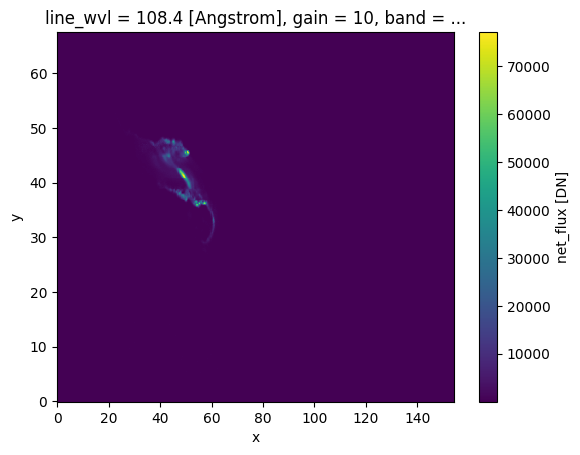

In [28]:
mom_slit_only_core.net_flux.isel(line=2).plot()

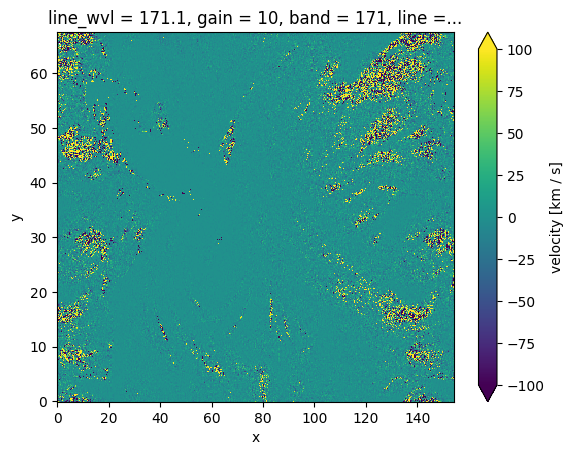

In [29]:
(mom_diff_removed-mom_only_core).velocity.isel(line=0).plot(vmin=-1e2, vmax=1e2)

(array([9.60000e+01, 1.21000e+02, 1.62000e+02, 2.13000e+02, 3.44000e+02,
        5.38000e+02, 1.04800e+03, 2.84100e+03, 2.58300e+04, 4.15147e+05,
        1.45320e+04, 2.17500e+03, 8.42000e+02, 5.00000e+02, 3.10000e+02,
        2.17000e+02, 1.71000e+02, 1.31000e+02, 9.00000e+01]),
 array([-950., -850., -750., -650., -550., -450., -350., -250., -150.,
         -50.,   50.,  150.,  250.,  350.,  450.,  550.,  650.,  750.,
         850.,  950.]),
 <BarContainer object of 19 artists>)

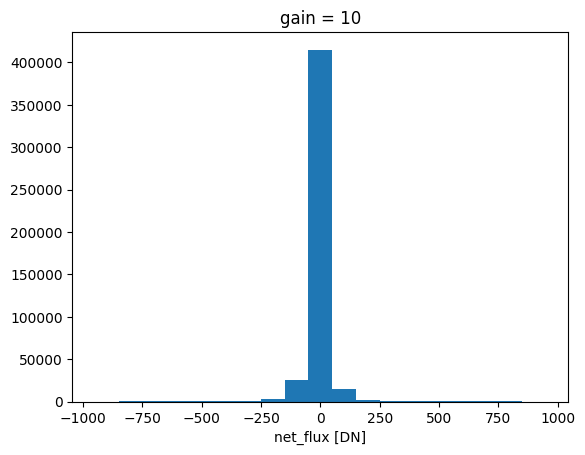

In [30]:
(mom_diff_removed-mom_only_core).net_flux.plot.hist(bins=np.arange(-950, 1050, 100))

In [34]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(specsum_diff).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    specsum_diff,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_specsum_diff.zarr', mode='w')

2025-08-13 17:29:47.914 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-13 17:29:47.914 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [43:23:40<00:00, 35.15s/it]

2025-08-15 12:53:31.811 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-15 12:53:31.812 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-15 12:53:31.813 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [35]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(specsum_only_core).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    specsum_only_core,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_specsum_only_core.zarr', mode='w')

2025-08-15 12:53:38.900 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-15 12:53:38.901 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [41:52:17<00:00, 33.92s/it]

2025-08-17 06:45:59.454 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-17 06:45:59.455 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-17 06:45:59.456 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [36]:
from muse.synthesis.synthesis import calc_error
noise0 = calc_error(spec_diff_removed).error
scaling = noise0.max()/noise0
vdem_inv = vdem_solve(
    spec_diff_removed,
    respsum, 
    model=model,
    scaling = scaling, 
    serial = True,
)
vdem_inv.to_zarr(base_path+'/vdem_spec_diff_removed.zarr', mode='w')

2025-08-17 06:46:07.793 | INFO     | muse.inversions.inversions:vdem_solve:269 - updated shape of R: (4096, 98980)
2025-08-17 06:46:07.794 | INFO     | muse.inversions.inversions:vdem_solve:270 - updated shape of b: (4096, 4444)


100%|████████████████████████████████████| 4444/4444 [44:48:31<00:00, 36.30s/it]

2025-08-19 03:34:42.551 | INFO     | muse.inversions.inversions:vdem_solve:847 - Solve: units of spectrum: DN
2025-08-19 03:34:42.552 | INFO     | muse.inversions.inversions:vdem_solve:848 - Solve: units of response: 1e-27 cm5 DN / s
2025-08-19 03:34:42.553 | INFO     | muse.inversions.inversions:vdem_solve:857 - Solve: units of VDEM: 1e+27 s / cm5


In [37]:
vdem_diff_inv = xr.open_zarr(base_path+'/vdem_specsum_diff.zarr').compute()
spec_diff_inv = vdem_synthesis(vdem_diff_inv, response, sum_over=["logT", "vdop"])
spec_diff_inv = exposure_time(spec_diff_inv, exp_time)
# spec_diff_inv = ph2dn(spec_diff_inv, response) 
spec_diff_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_sub_cont = sub_contaminants(specsum_diff, spec_diff_inv)
mom_diff_inv = gaussian_fitting_analysis(
    spec_diff_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_inv.to_zarr(base_path+'/mom_diff_inv', mode='w')

mom_diff_sub_cont = gaussian_fitting_analysis(
    spec_diff_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_inv["velocity"],
                "serial": serial_gfat})
mom_diff_sub_cont.to_zarr(base_path+'/mom_diff_sub_cont', mode='w')

2025-08-19 03:35:12.398 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [38]:
vdem_only_core_inv = xr.open_zarr(base_path+'/vdem_specsum_only_core.zarr').compute()
spec_only_core_inv = vdem_synthesis(vdem_only_core_inv, response, sum_over=["logT", "vdop"])
spec_only_core_inv = exposure_time(spec_only_core_inv, exp_time)
# spec_only_core_inv = ph2dn(spec_only_core_inv, response) 
spec_only_core_inv['flux'].attrs['exp_time'] = exp_time
spec_only_core_sub_cont = sub_contaminants(specsum_only_core, spec_only_core_inv)
mom_only_core_inv = gaussian_fitting_analysis(
    spec_only_core_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_only_core_inv.to_zarr(base_path+'/mom_only_core_inv', mode='w')

mom_only_core_sub_cont = gaussian_fitting_analysis(
    spec_only_core_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_only_core_inv["velocity"],
                "serial": serial_gfat})
mom_only_core_sub_cont.to_zarr(base_path+'/mom_only_core_sub_cont', mode='w')

2025-08-19 03:40:03.849 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [39]:
vdem_diff_removed_inv = xr.open_zarr(base_path+'/vdem_spec_diff_removed.zarr').compute()
spec_diff_removed_inv = vdem_synthesis(vdem_diff_removed_inv, response, sum_over=["logT", "vdop"])
spec_diff_removed_inv = exposure_time(spec_diff_removed_inv, exp_time)
# spec_diff_removed_inv = ph2dn(spec_diff_removed_inv, response) 
spec_diff_removed_inv['flux'].attrs['exp_time'] = exp_time
spec_diff_removed_sub_cont = sub_contaminants(spec_diff_removed, spec_diff_removed_inv)
mom_diff_removed_inv = gaussian_fitting_analysis(
    spec_diff_removed_inv,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range_guided, "serial": serial_gfat})
mom_diff_removed_inv.to_zarr(base_path+'/mom_diff_removed_inv', mode='w')

mom_diff_removed_sub_cont = gaussian_fitting_analysis(
    spec_diff_removed_sub_cont,
    response,
    line_band_key=line,
    kwargs_obs={"npix": npix, "velocity_range": velocity_range, 
                "velocity_array": mom_diff_removed_inv["velocity"],
                "serial": serial_gfat})
mom_diff_removed_sub_cont.to_zarr(base_path+'/mom_diff_removed_sub_cont', mode='w')

2025-08-19 03:44:58.664 | INFO     | muse.synthesis.synthesis:exposure_time:773 - Exposure time has been previously applied.


/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/optimize/_minpack_py.py:945: RuntimeWarning: divide by zero encountered in divide
  transform = 1.0 / sigma
/Users/khcho/miniforge3/envs/muse_python/lib/python3.11/site-packages/scipy/opti

In [76]:
from datetime import datetime
from dateutil.tz import gettz
from pathlib import Path
import json

def serialize_model(model):
    """
    Serialize a model to a dictionary.

    Args:
        model (object): The model to be serialized.

    Returns
    -------
        dict: The serialized model.
    """
    if model is None:
        return None
    return {
        "class": model.__module__ + "." + model.__class__.__name__,
        "parameters": model.get_params(),
    }

def plot_from_moment(
    mom_gt, 
    mom_inv, 
    spec_obs, 
    spec_inv, 
    *,
    gt_title='',
    cont_title='', 
    model_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    model_name="muse_vdem_m-flare-muram_los2_trac_565000.zarr",
    resp_path_sg="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_with_slits/",
    resp_path_ci="/Users/juanms/python/LMSAL_HUB/muse_hub/muse-notebooks/Respfunc/Base_line/response_functions_CI/",
    FeXIX_108_resp="respfunc_108_FeXIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXXI_108_resp="respfunc_108_FeXXI_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_108_resp="respfunc_108-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeIX_171_resp="respfunc_171_FeIX_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_171_resp="respfunc_171-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    FeXV_284_resp="respfunc_284_FeXV_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    contam_284_resp="respfunc_284-L_nslits35_sep390_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    ci_195_resp="respfunc_195_CI_coronal_2021_chianti_coatingOptixFab_JMS_24Sept24.zarr",
    syn_path="/Users/juanms/MUSE_INV/muse_models/Flare_Test_num_t3_r1e-12_interp_ds/",
    effect_path="/Volumes/Space/MUSE_GCP/muse_response_function/effective_area/25_oct_2025/",
    effect_area_108="effective_area_band_108_JMS_2024-10-31.zarr",
    effect_area_171="effective_area_band_171_JMS_2024-10-31.zarr",
    effect_area_284="effective_area_band_284_JMS_2024-10-31.zarr",
    obs_filename_ci=None,
    obs_filename_sg=None,
    gt_filename_sg=None,
    serial_gfat=False,
    run_SDC=True,
    serial_SDC=True,
    run_mask=None,  # ["gt_vdem", "redundant", "intensity", "data_driven"]
    redundant_mask=None,
    velbin_inv=None,
    tgbin_inv=None,
    ntgbin_inv=None,
    rotate=False,
    saturation=None,
    KEYS=None,  # [None,"middle","bottom", "all"]
    target=None,  # ["QS","AR","FL"]
    jump_pix=None,  # [10,10] Jump in y-axis and t-step
    logT=None,
    vdop=None,
    logT_inv=None,
    vdop_inv=None,
    nslits=35,
    model=None,
    model2=None,
    data_driven_mask_model=None,
    data_driven_mask_keyword=None,
    exp_time=0.1,
    noise=False,
    noise_seed=123456789,
    readoutnoise=2.24,
    compression: int = 1,
    npix=2,
    max_vel=50,
    velocity_range=50,
    velocity_range_gt=None,
    velocity_range_guided=None,
    intensity_scaling=None,  # ["noise", "no_noise", None]
    response_info="0.390/0.780 A",
    line=['Fe IX', 'Fe XV', 'Fe XIX 108.355'], 
    savefigs=True,
    savepath="./",
    save_id="",
    savelogfile="sdc_benchmark.json",
    logger=logger,
    save_output=False,
    save_output_netcdf=False,
    author="JMS",
    appendlog=None,
    disable_pbar=False,
    run_cont_id=False,
    dens_eff=1e9,  # The VDEM could be expanded to include density dependence (and the response function)
    pres_eff=3e15,  # The VDEM could be expanded to include density dependence (and the response function)
    lgtgmin_eff=4.8,
    int_cont_ratio=1e2,
    main_lines_cont=None,
    n_cont_top=20,
    cuda_device=3,
    pad_value=3,
    response_scaling=None,  # "auto", None
    unmask_outliers=True,
    randomizeSVD=True,
    muse_fov_mode="wrap",
    thresholds_ph=None,
    thresholds_dn=None,
    passbands_to_solve=None,
):

    logfile = {}
    logfile["model"] = serialize_model(model)    

    
    mask_gt = masker("auto", mom_gt, line_band_list=line, 
                     thresholds_ph=thresholds_ph, thresholds_dn=thresholds_dn)
    mask_inv = masker(
        "auto", mom_inv, line_band_list=line, thresholds_ph=thresholds_ph, 
        thresholds_dn=thresholds_dn)
    mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)
    outliers = get_outliers_newer(mom_inv, mom_gt, line_band_list=line, mask=mask_all, factor_int=4)
    pdb.set_trace()
    sigma = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all)
    kargs = {"percentile": 95}
    sigma2 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    kargs = {"percentile": 99.7}
    sigma3 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)
    full_mask = mask_all.net_flux.sum("line", skipna=True)
    full_mask = xr.where(full_mask > 0, 1, 0)
    outs_full = 0
    for li in line:
        outs_full = outs_full + outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
    outs_full = xr.where(outs_full > 0, 1, 0)
    frac_full = 100 * outs_full.sum(dim=["x", "y"]).values / full_mask.sum(dim=["x", "y"]).values
    logfile[f"Outliers__frac"] = frac_full
    
    WEST = gettz("US/Western")
    reapname = f"{FeXIX_108_resp[19:-20]}"
    
    # plotting
    suptitle_string = {}
    modelname = model_name.split("/")[-1][:-5] if model_name is not None else obs_filename_sg.split("/")[-1][:-5]
    
    # Make modelname shorter (or will be too long for the filename):
    model_parts = modelname.split("_")
    reap_parts = reapname.split("_")
    unique_model_parts = [part for part in model_parts if part not in reap_parts]
    modelname = "_".join(unique_model_parts)
    # spec_inv_muse = sum_lines_slits_per_band(spec_inv)
    spec_inv_muse = spec_inv.sum('slit')
    if 'line' in spec_inv_muse.dims:
        spec_inv_muse = spec_inv_muse.sum('line')
    Chi_error_ystep = np.abs(spec_inv_muse.flux - spec_obs.flux).sum(dim=["y", "SG_xpixel", "step"])
    for li in line:
        out_mu_sigma = outliers[li]["velocity"]["values"] + outliers[li]["linewidth"]["values"]
        out_mu_sigma = xr.where(out_mu_sigma > 0, 1, 0)
        frac = (
            100
            * out_mu_sigma.sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"Outliers__frac_{li}"] = frac
        logfile[f"outliers__frac_{li}_net_flux"] = (
            100
            * outliers[li]["net_flux"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_velocity"] = (
            100
            * outliers[li]["velocity"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        logfile[f"outliers__frac_{li}_linewidth"] = (
            100
            * outliers[li]["linewidth"]["values"].sum(dim=["x", "y"]).values
            / xr.where(mask_all.net_flux.sel(line=li).values > 0, 1.0, 0.0).sum()
        )
        for ivars in ["net_flux", "velocity", "linewidth"]:
            logfile[f"sigma1__frac_{li}_{ivars}"] = sigma[li][ivars]
            logfile[f"sigma2__frac_{li}_{ivars}"] = sigma2[li][ivars]
            logfile[f"sigma3__frac_{li}_{ivars}"] = sigma3[li][ivars]
        kband = mom_inv.band.sel(line=li)
        if run_SDC:
            suptitle_string[li] = (
                f"{logfile['model']['class'].split('.')[-1]}, {logfile['model']['parameters']['alpha']:.1e}, {logfile['model']['parameters']['fit_intercept']}, Abs. error {Chi_error_ystep.sel(band=kband).data:.2e} \n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
        else:
            suptitle_string[li] = (
                f"\n GFAT-sub, {velocity_range} km/s; Out[{li}]%: {frac:.2f}, Out[all]%: {frac_full:.2f}"
            )
    plot_with_chisquare(
        mom_inv,
        mom_gt,
        line,
        mask_obs=mask_inv,
        mask_gt=mask_gt,
        mask_all=mask_all,
        response=response_info,
        xaxis_gt=True,
        max_vel=max_vel,
        min_vel=-max_vel,
        suptitle_string=suptitle_string,
        save_id=f"GFAT_sub_{save_id}_GTnoise_{exp_time}sec__{modelname}_{reapname}_{author}_{datetime.now(WEST).date()!s}",
        savepath=savepath,
        outliers=outliers,
        cont_title=cont_title,
        gt_title=gt_title,
        sigmas=[sigma, sigma2, sigma3],
    )
    
    with (Path(savepath) / savelogfile).open("w") as fp:
        keys_to_remove = []
        for key in logfile:
            try:
                json.dumps(logfile[key])
            except (TypeError, OverflowError):
                logger.info(f"Key: {key} is not JSON serializable and will be removed from the logfile")
                keys_to_remove.append(key)
        for key in keys_to_remove:
            logfile.pop(key)
        json.dump(logfile, fp, indent=4)

In [52]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff, 
    specsum_diff, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_diff', 
    save_id = 'diff',  
    cont_title = 'diff', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:19:40.465 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff/FeIX_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:19:54.281 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff/FeXV_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:20:07.482 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff/FeXIX108.355_map_GFAT_sub_diff_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png


In [53]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_inv, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv', 
    save_id = 'diff_inv',  
    cont_title = 'diff inv', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:20:45.811 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv/FeIX_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:20:59.543 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv/FeXV_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:21:12.788 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv/FeXIX108.355_map_GFAT_sub_diff_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png


In [54]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_sub_cont, 
    specsum_diff, 
    spec_diff_inv, 
    savepath = base_path+'/plot_diff_inv_sub_cont', 
    save_id = 'diff_inv_sub_cont',  
    cont_title = 'diff inv sub_cont', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:21:47.282 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv_sub_cont/FeIX_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:22:00.583 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv_sub_cont/FeXV_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:22:13.942 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingO

> /var/folders/1n/h1tn4xf511bdd_rqlgcl4kqw000mt3/T/ipykernel_75690/1913520793.py(127)plot_from_moment()
    125     outliers = get_outliers_newer(mom_inv, mom_gt, line_band_list=line, mask=mask_all, factor_int=4)
    126     pdb.set_trace()
--> 127     sigma = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all)
    128     kargs = {"percentile": 95}
    129     sigma2 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)



ipdb>  ourliers


*** NameError: name 'ourliers' is not defined


ipdb>  !outliers


{'Fe IX': {'net_flux': {'percent': 0.8074027034382655, 'values': <xarray.DataArray 'net_flux' (y: 404, x: 385)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ...,  0., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * y         (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl  float64 171.1
    gain      int64 10
    band      int64 171
    line      <U23 'Fe IX'
  * x         (x) float64 0.0 0.401 0.8021 1.203 ... 152.8 153.2 153.6 154.0}, 'velocity': {'percent': 2.264583144334573, 'values': <xarray.DataArray 'velocity' (y: 404, x: 385)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ...,  0., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       

ipdb>  outliers['Fe IX']


{'net_flux': {'percent': 0.8074027034382655, 'values': <xarray.DataArray 'net_flux' (y: 404, x: 385)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ...,  0., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * y         (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl  float64 171.1
    gain      int64 10
    band      int64 171
    line      <U23 'Fe IX'
  * x         (x) float64 0.0 0.401 0.8021 1.203 ... 152.8 153.2 153.6 154.0}, 'velocity': {'percent': 2.264583144334573, 'values': <xarray.DataArray 'velocity' (y: 404, x: 385)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ...,  0., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan,

ipdb>  outliers['Fe IX']['velocity']


{'percent': 2.264583144334573, 'values': <xarray.DataArray 'velocity' (y: 404, x: 385)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan,  0.,  0.],
       [nan, nan, nan, ...,  0.,  0.,  0.],
       ...,
       [nan, nan, nan, ...,  0., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
  * y         (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl  float64 171.1
    gain      int64 10
    band      int64 171
    line      <U23 'Fe IX'
  * x         (x) float64 0.0 0.401 0.8021 1.203 ... 152.8 153.2 153.6 154.0}


ipdb>  outliers['Fe IX']['velocity'].plot() ; plt.show()


*** AttributeError: 'dict' object has no attribute 'plot'


ipdb>  outliers['Fe IX']['velocity'].values.plot() ; plt.show()


*** AttributeError: 'builtin_function_or_method' object has no attribute 'plot'


ipdb>  outliers['Fe IX']['velocity'].value.plot() ; plt.show()


*** AttributeError: 'dict' object has no attribute 'value'


ipdb>  outliers['Fe IX']['velocity']['values'].plot() ; plt.show()


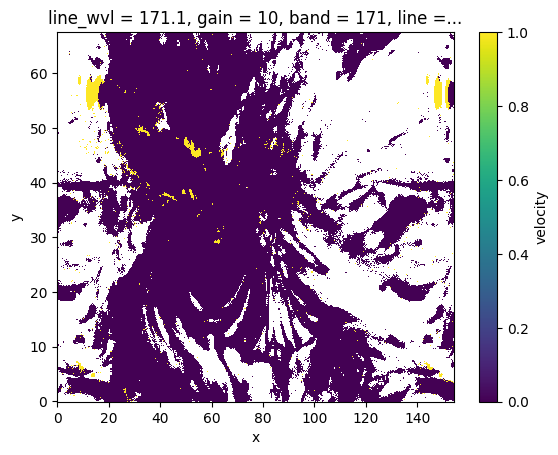

ipdb>  q


In [77]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core, 
    specsum_only_core, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_only_core', 
    save_id = 'only_core',  
    cont_title = 'only core', 
    gt_title = "Noise only core",
    model = model) 


In [56]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core_inv, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv', 
    save_id = 'only_core_inv',  
    cont_title = 'only core inv', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:23:51.130 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv/FeIX_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:24:04.183 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv/FeXV_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:24:17.467 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv/FeXIX108.355_map_GFAT_sub_only_core_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png

In [57]:
plot_from_moment(
    mom_slit_only_core, 
    mom_only_core_sub_cont, 
    specsum_only_core, 
    spec_only_core_inv, 
    savepath = base_path+'/plot_only_core_inv_sub_cont', 
    save_id = 'only_core_inv_sub_cont',  
    cont_title = 'only_core inv sub_cont', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:24:52.104 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv_sub_cont/FeIX_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:25:05.032 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv_sub_cont/FeXV_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:25:17.992 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_only_core_inv_sub_cont/FeXIX108.355_map_GFAT_sub_only_core_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390

> /var/folders/1n/h1tn4xf511bdd_rqlgcl4kqw000mt3/T/ipykernel_75690/1913520793.py(127)plot_from_moment()
    125     outliers = get_outliers_newer(mom_inv, mom_gt, line_band_list=line, mask=mask_all, factor_int=4)
    126     pdb.set_trace()
--> 127     sigma = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all)
    128     kargs = {"percentile": 95}
    129     sigma2 = get_moment_limits(mom_inv, mom_gt, line, mask=mask_all, **kargs)



ipdb>  outliers['Fe IX']['velocity']['values'].plot() ; plt.show()


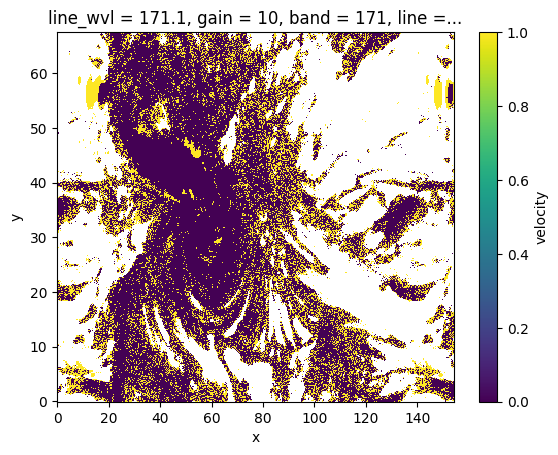

ipdb>  q


In [78]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed, 
    spec_diff_removed, 
    spec_slit_only_core, 
    savepath = base_path+'/plot_diff_removed', 
    save_id = 'diff_removed',  
    cont_title = 'diff removed', 
    gt_title = "Noise only core",
    model = model) 


In [59]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed_inv, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv', 
    save_id = 'diff_removed_inv',  
    cont_title = 'diff removed inv', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:26:58.184 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv/FeIX_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:27:11.932 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv/FeXV_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:27:24.912 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv/FeXIX108.355_map_GFAT_sub_diff_removed_inv_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_

In [60]:
plot_from_moment(
    mom_slit_only_core, 
    mom_diff_removed_sub_cont, 
    spec_diff_removed, 
    spec_diff_removed_inv, 
    savepath = base_path+'/plot_diff_removed_inv_sub_cont', 
    save_id = 'diff_removed_inv_sub_cont',  
    cont_title = 'diff removed inv sub cont', 
    gt_title = "Noise only core",
    model = model) 


2025-08-19 10:28:00.396 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv_sub_cont/FeIX_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:28:13.517 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv_sub_cont/FeXV_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_565000_nslits35_sep390_coronal_2021_chianti_coatingOptixF_JMS_2025-08-19.png
2025-08-19 10:28:26.901 | INFO     | muse.utils.miscellaneous:plot_with_chisquare:605 - Saving figure to /Users/khcho/MUSE/diffraction/555LPI_noise_test/plot_diff_removed_inv_sub_cont/FeXIX108.355_map_GFAT_sub_diff_removed_inv_sub_cont_GTnoise_0.1sec__muse_vdem_m-flare-muram_los2_trac_5650

In [132]:
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
target_obj = mom_diff_removed_inv
mask_gt = masker("auto", mom_slit_only_core, line_band_list=line, 
                 thresholds_ph=None, thresholds_dn=None)
mask_inv = masker("auto", target_obj, line_band_list=line, 
                  thresholds_ph=None, thresholds_dn=None)
mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)

15176 79878.0 0.18998973434487593


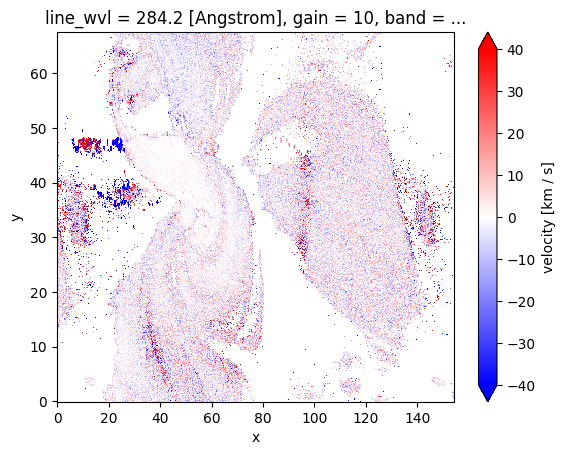

In [133]:
line = 1
aa = (target_obj*mask_all).isel(line=line)
bb = (mom_slit_only_core*mask_all).isel(line=line)

thres = 10 if line != 2 else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.isel(line=line).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

In [135]:
line=['Fe IX', 'Fe XV', 'Fe XIX 108.355']
target_obj = mom_only_core_inv
mask_gt = masker("auto", mom_slit_only_core, line_band_list=line, 
                 thresholds_ph=None, thresholds_dn=None)
mask_inv = masker("auto", target_obj, line_band_list=line, 
                  thresholds_ph=None, thresholds_dn=None)
mask_all = xr.where(mask_inv == 1, mask_inv, mask_gt)

6116 77993.0 0.07841729385970536


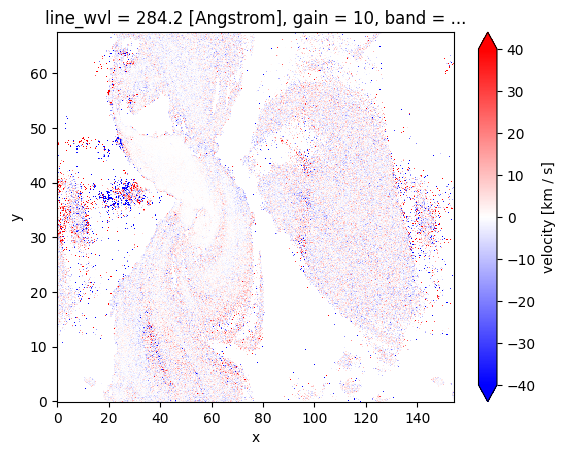

In [136]:
line = 1
aa = (target_obj*mask_all).isel(line=line)
bb = (mom_slit_only_core*mask_all).isel(line=line)

thres = 10 if line != 2 else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.isel(line=line).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

6685 83802.0 0.07977136583852414


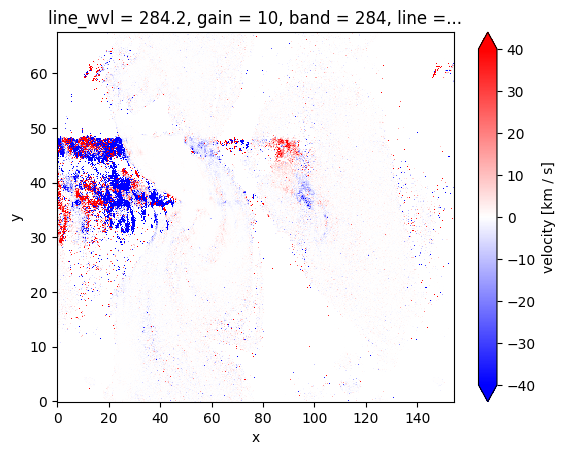

In [103]:
line = 1
aa = (target_obj*mask_all).isel(line=line)
bb = (mom_slit_only_core*mask_all).isel(line=line)

thres = 10 if line != 2 else 30
n1 = (abs(bb-aa).velocity > thres).sum()
n2 = mask_all.velocity.isel(line=line).sum()
print(n1.values, n2.values, (n1/n2).values)

((target_obj-mom_slit_only_core)*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

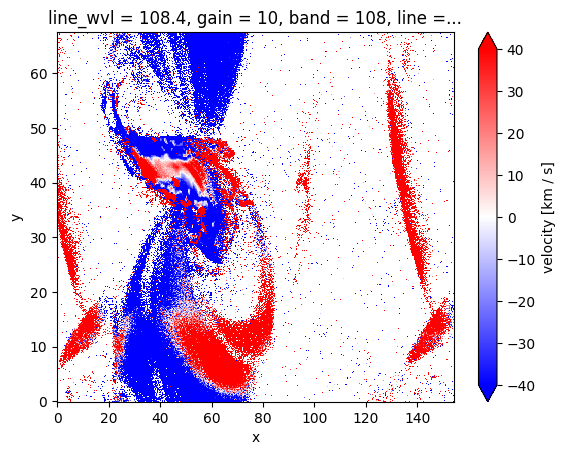

In [53]:
(mom_only_core*mask_all).velocity.isel(line=line).plot(vmin=-40, vmax=40, cmap='bwr')

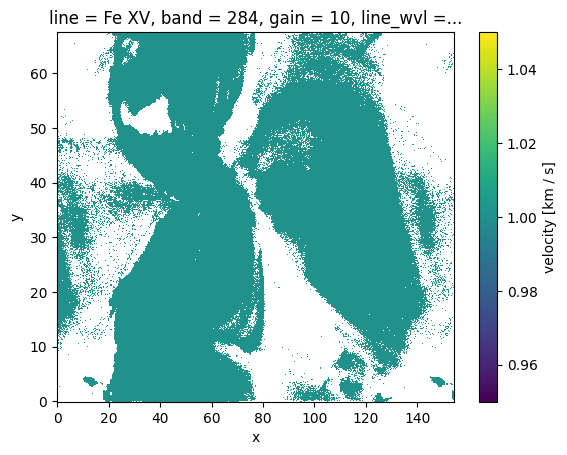

In [74]:
mask_inv.velocity.isel(line=1).plot()

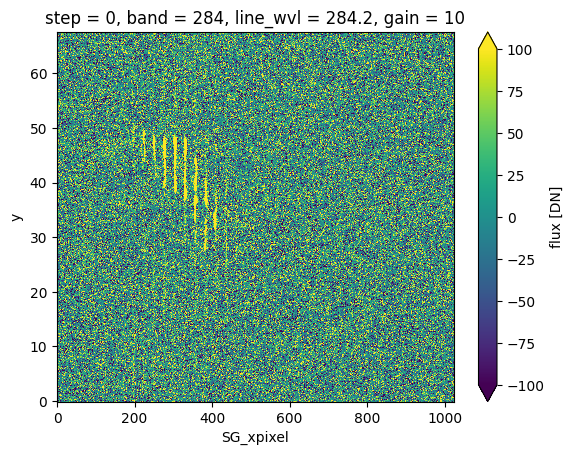

In [128]:
(specsum_diff-spec_slit_only_core.sum('slit')).flux.isel(band=2, step=0).plot(vmin=-1e2, vmax=1e2)

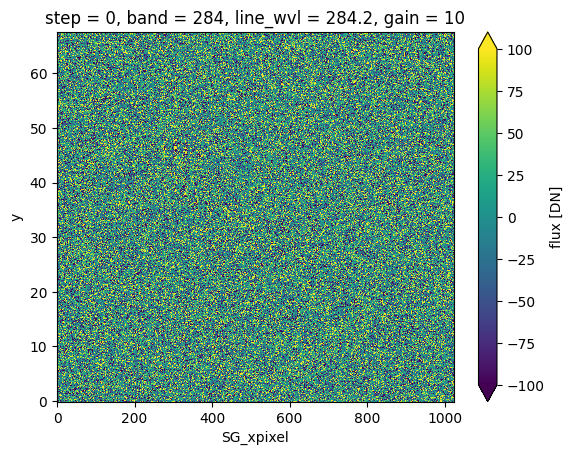

In [129]:
(spec_diff_removed-spec_slit_only_core.sum('slit')).flux.isel(band=2, step=0).plot(vmin=-1e2, vmax=1e2)

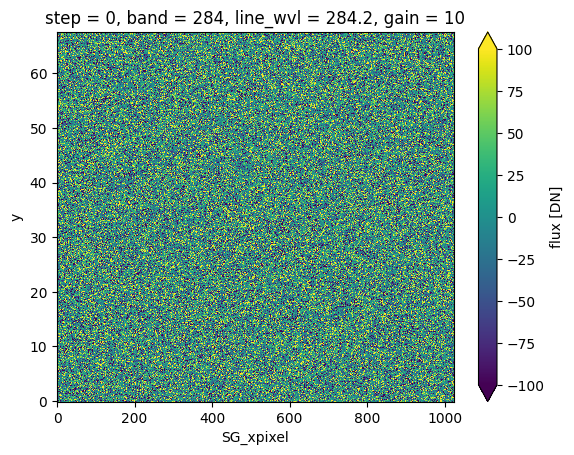

In [130]:
(specsum_only_core - spec_slit_only_core.sum('slit')).flux.isel(band=2, step=0).plot(vmin=-1e2, vmax=1e2)

In [119]:
mom_slit_only_core.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97, 'only_core': [True, True, True]})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'ph2dn(spec=spec, response=response)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)

In [120]:
mom_only_core.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97, 'only_core': [True, True, True]})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'sum_lines_slits_per_band(spec=spec)',
 'ph2dn(spec=spec, response=response)',
 'ad

In [121]:
mom_diff.attrs['HISTORY']

['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=35, nraster=11, restype=match_res_tile, mode=wrap, sub_interpolation=2)',
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'reshape_rs2x(ds=ds, nslits=35, nraster=11)',
 "vdem_syn_join_slits_wvl(response=response, vdem=vdem, islits=(2, 32), sum_over=('logT', 'vdop'), band=(108, 171, 284), line=line, cuda_device=None)",
 "convolve_model_psf(spectrum=spectrum, model=<function gausslobes at 0x1ea6fbe20>, fixed_psf_per_channel=False, band=[108, 171, 284], inplace=False, kwargs={'oversample_x': 3, 'slit_dim': 404, 'lpi': 5, 'fwhm': 0.5, 'transmission': 0.97})",
 'reshape_x2rs(ds=ds, nslits=35, nraster=11)',
 'muse_interp_xyw2rssg(spec=spec, response=response, band=band, line=line, method=cubic, kwargs={})',
 'exposure_time(spec=spec, exp_time=0.6)',
 'add_noise_poisson(spectra=spectra, response=response, seed=123456789)',
 'sum_lines_slits_per_band(spec=spec)',
 'ph2dn(spec=spec, response=response)',
 'add_noise_readout(spectra=spectra, 

In [62]:
mom_slit_only_core.net_flux.isel(line=2).median()

<xarray.DataArray 'net_flux' ()>
array(23.82872661)
Coordinates:
    band      int64 108
    gain      int64 10
    line      <U14 'Fe XIX 108.355'
    line_wvl  float64 108.4
Attributes:
    exp_time:  0.6
    units:     DN

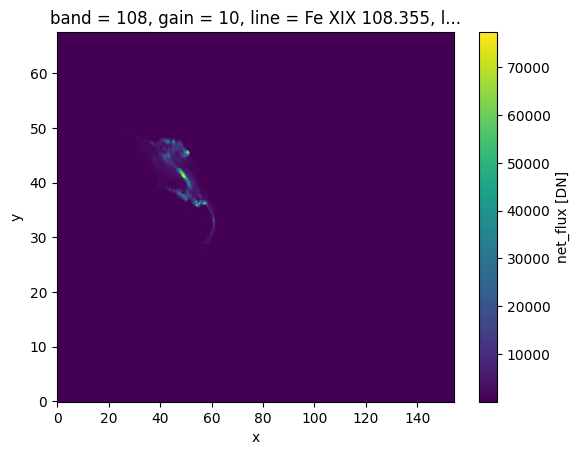

In [57]:
mom_slit_only_core.net_flux.isel(line=2).plot()

In [67]:
cen_sgx = np.abs(spec_merge_line.SG_wvl.sel(band=284) - spec_merge_line.line_wvl.sel(band=284)).argmin(dim='SG_xpixel')
aa = spec_merge_line.flux.sel(band=284, 
                         SG_xpixel=cen_sgx, 
                         method='nearest')


In [68]:
aa_core = spec_only_core.flux.sel(band=284, SG_xpixel=cen_sgx, method='nearest').transpose('y', 'x')

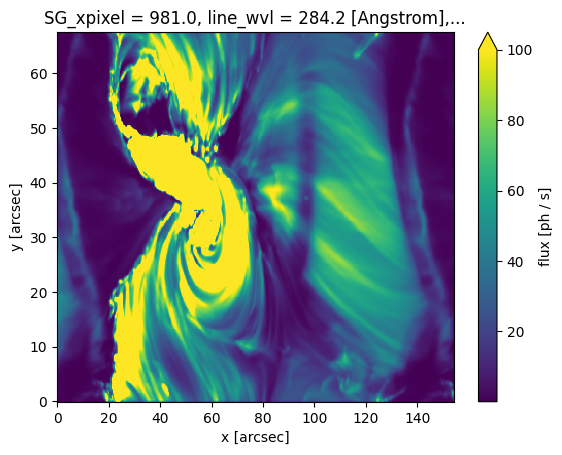

In [69]:
aa_core.plot(vmax=100)

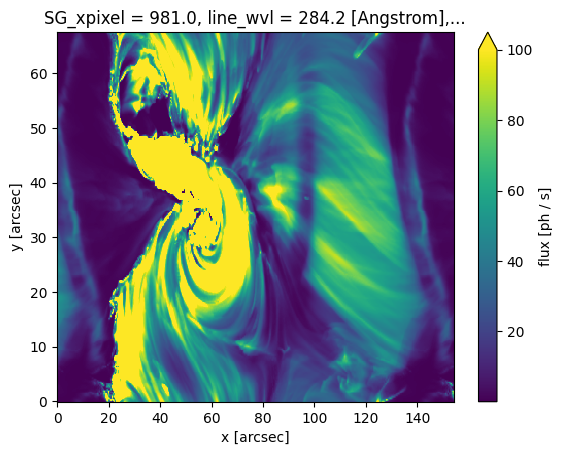

In [70]:
aa.plot(vmax=100)

In [71]:
from scipy.signal import fftconvolve, deconvolve
from scipy.fftpack import fftn, ifftn, fftshift, ifftshift
from importlib import reload
import muse.instr.mono_diffraction
reload(muse.instr.mono_diffraction)
from muse.instr.mono_diffraction import mono_image, diffraction_removal_in_2d, find_sgx_pixel_from_wavelength
import astropy.units as u

In [72]:
psf = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs).T
psf_core = gausslobes(wavelength=aa.line_wvl.item()*u.AA, **kargs, only_core=True).T
n_psf = psf / np.sum(psf)
# bbb = fftconvolve(aa, psf, mode='same')

In [73]:
ay, ax = aa.shape
psfy, psfx = psf.shape

In [75]:
aa0, psf0 = match_size(aa, psf)

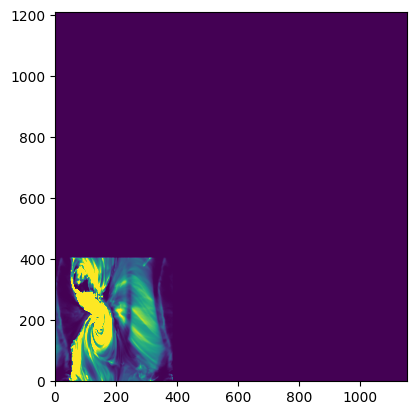

In [74]:
aa12 = np.zeros((ay+psfy-1, ax+psfx-1))
aa12[:ay, :ax] = aa
plt.imshow(aa12, vmax=100)

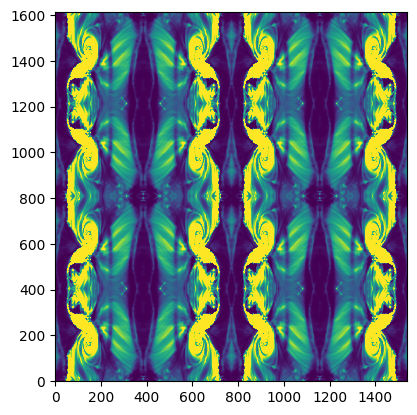

In [76]:
plt.imshow(aa0, vmax=100)

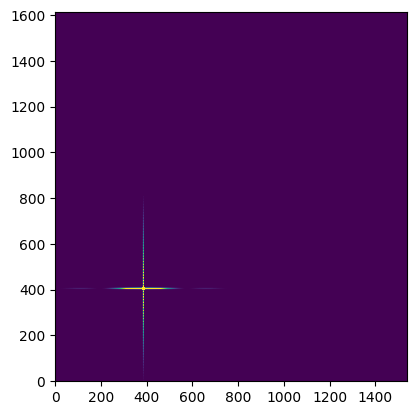

In [29]:
plt.imshow(psf0, vmax=1e-5)

In [30]:
# bb0 = np.real(ifftn(fftn(aa0)*fftn(psf0)))
bb = fftconv(aa, psf)
bb0 = fftconv(aa, psf, crop=False)

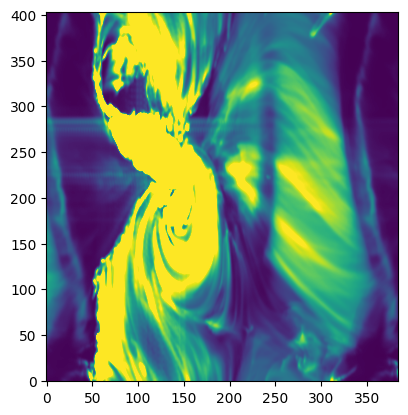

In [31]:
plt.imshow(bb, vmax=100)

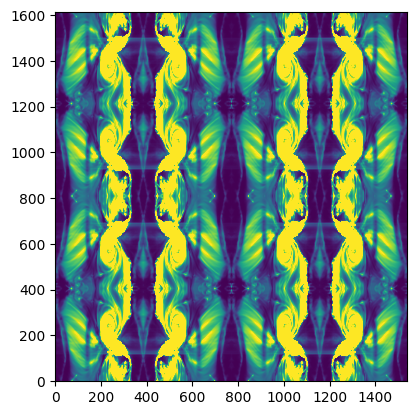

In [32]:
plt.imshow(bb0, vmax=100)

In [33]:
cc0 = np.real(np.fft.ifft2(np.fft.fft2(bb0)/np.fft.fft2(psf0)))

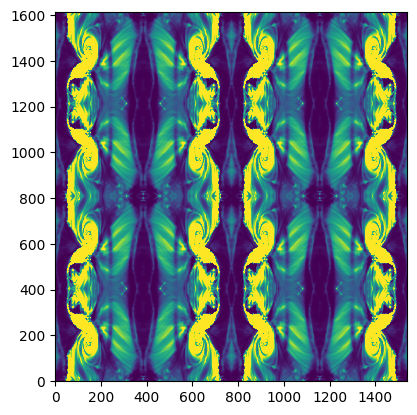

In [34]:
plt.imshow(cc0, vmax=100)

In [36]:
iter = 25
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconv(img_decon,n_psf)
    img_decon = img_decon*fftconv(ratio, n_psf[::-1, ::-1])
cc = fftconv(img_decon/np.sum(psf), psf_core)    

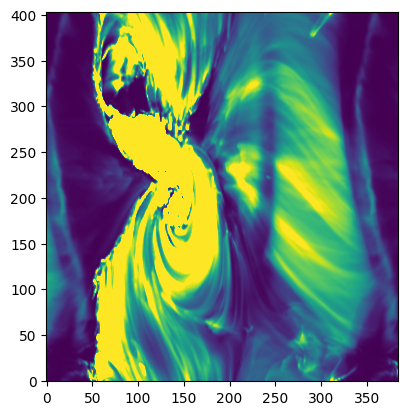

In [37]:
plt.imshow(img_decon, vmax=1e2, vmin=0)

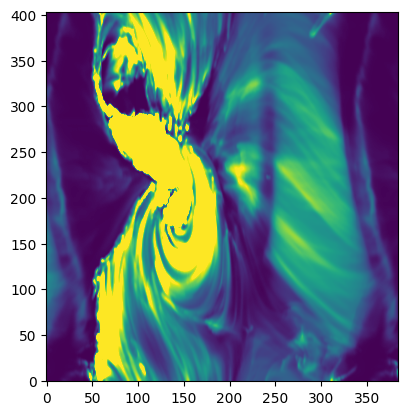

In [38]:
plt.imshow(cc, vmax=1e2, vmin=0)

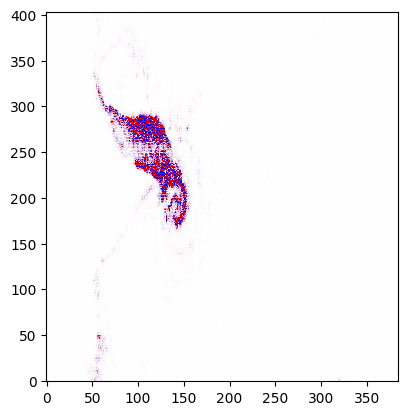

In [1120]:
plt.imshow(img_decon/np.sum(psf)-aa, vmin=-1e2, vmax=1e2, cmap='bwr')


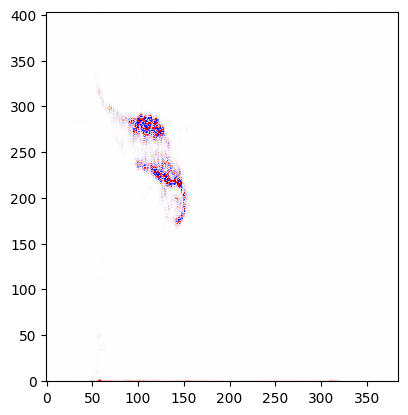

In [1131]:
plt.imshow(cc-aa_core, vmin=-1e2, vmax=1e2, cmap='bwr')


In [1076]:
iter = 25
psff = fftn(psf)
img_decon = np.copy(bb)
for _ in range(iter):
    ratio = bb / fftconvolve(img_decon, psf, mode='same')
    img_decon = img_decon*fftconvolve(ratio, psf[::-1, ::-1], mode='same')
cc = fftconvolve(img_decon, psf_core, mode='same')    

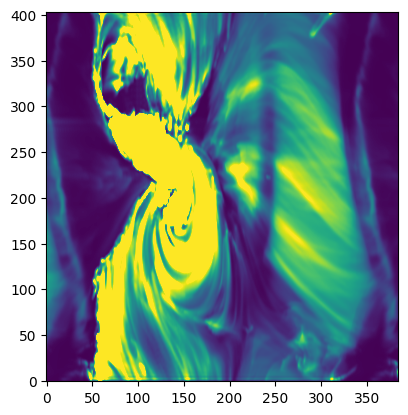

In [1077]:
plt.imshow(cc, vmax=1e2, vmin=0)

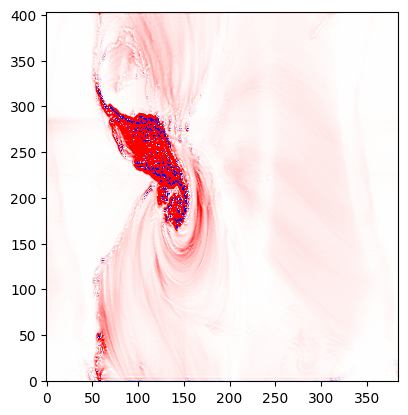

In [1078]:
plt.imshow(cc-aa, vmin=-1e2, vmax=1e2, cmap='bwr')

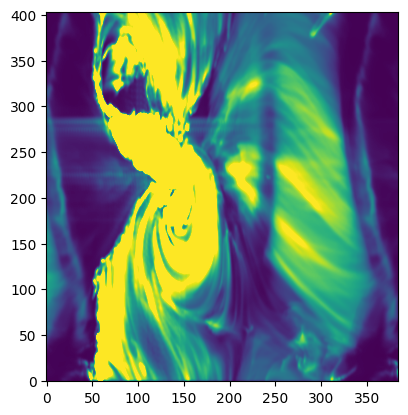

In [818]:
plt.imshow(bbb, vmax=100)

In [861]:
cc0 = np.real(ifftn(fftn(bb0)/fftn(psf0)))

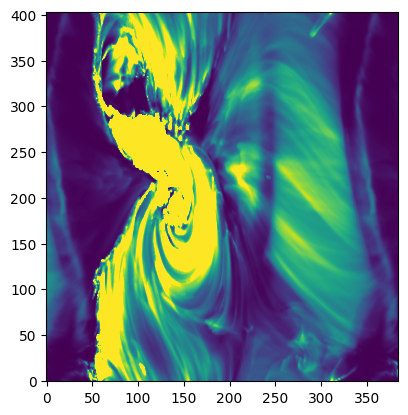

In [863]:
plt.imshow(cc0[:ay, :ax], vmin=0, vmax=100)

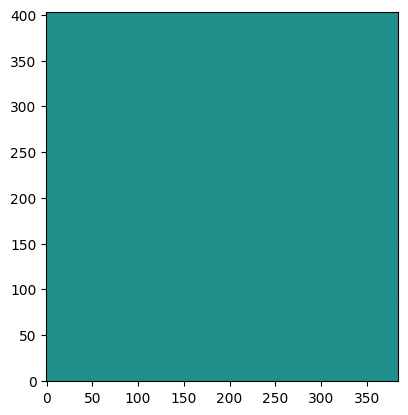

In [866]:
plt.imshow(cc0[:ay, :ax]-aa, vmin=-1e-5, vmax=1e-5)

In [95]:
spec_diff_removed_inv.swap_dims({'line':'band'}).sel(band=spec_diff_removed_inv.band[0])

<xarray.Dataset>
Dimensions:    (slit: 35, step: 11, y: 404, band: 3, SG_xpixel: 1024)
Coordinates:
  * slit       (slit) int64 0 1 2 3 4 5 6 7 8 9 ... 26 27 28 29 30 31 32 33 34
  * step       (step) int64 0 1 2 3 4 5 6 7 8 9 10
  * y          (y) float64 0.0 0.1674 0.3348 0.5022 ... 66.97 67.13 67.3 67.47
    line_wvl   (band) float64 108.4 108.1 108.4
    gain       (band) int64 10 10 10
    band       (band) int64 108 108 108
    line       (band) <U23 'Fe XIX 108.355' 'Fe XXI' '[108] missing main line'
  * SG_xpixel  (SG_xpixel) int64 0 1 2 3 4 5 6 ... 1018 1019 1020 1021 1022 1023
Data variables:
    flux       (slit, step, y, band, SG_xpixel) float32 0.0 0.0 ... 0.009628
    SG_wvl     (band, slit, SG_xpixel) float64 107.7 107.7 107.7 ... 109.4 109.5
Attributes:
    Chianti version:  10.1
    HISTORY:          ['create_resp_func_nullvel(line_list=line_list, instr_w...
    RESP_HISTORY:     ['create_resp_func_nullvel(line_list=line_list, instr_w...
    SPEC_HISTORY:     ['muse_fov(vdem=vdem, dx_pix=0.4, dy_pix=0.167, nslits=...
    abundance:        sun_coronal_2021_chianti
    date created:     29-Oct-2024
    date modified:    17-Jul-2025
    flux units:       ph/s
    step_size:        0.4010416666666667
    step_size units:  arcsec
    version:          0.2.dev6+g6505469

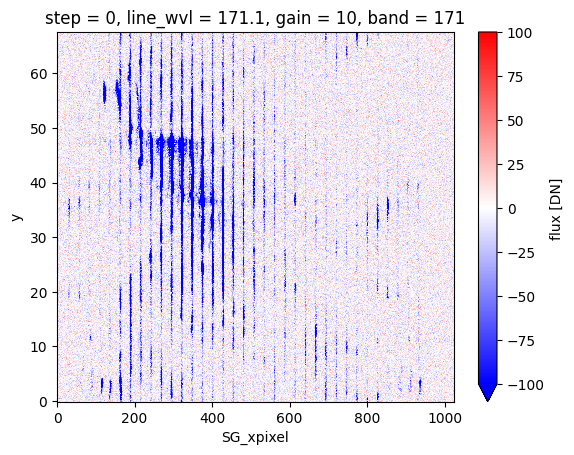

In [81]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = specsum_diff.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

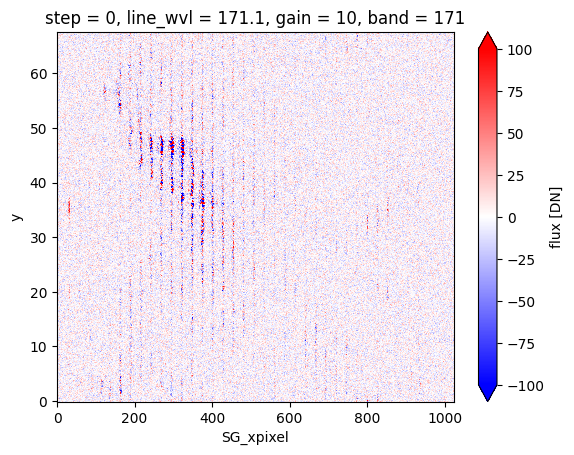

In [82]:
band = spec_diff_removed.band[1]
aa = specsum_only_core.flux.sel(band=band)
bb = spec_diff_removed.flux.sel(band=band)
(aa-bb).isel(step=0).plot(vmin=-100, vmax=100, cmap='bwr')

In [83]:
band = spec_diff_removed.band[1]
aa = spec_diff_removed.flux.sel(band=band)
bb = spec_diff_removed_inv.flux.swap_dims({'line':'band'}).sel(band=band).sum(dim=['slit', 'band'])
(aa-bb).isel(step=0).plot(vmin=-5, vmax=5, cmap='bwr')

NameError: name 'spec_diff_removed_inv' is not defined

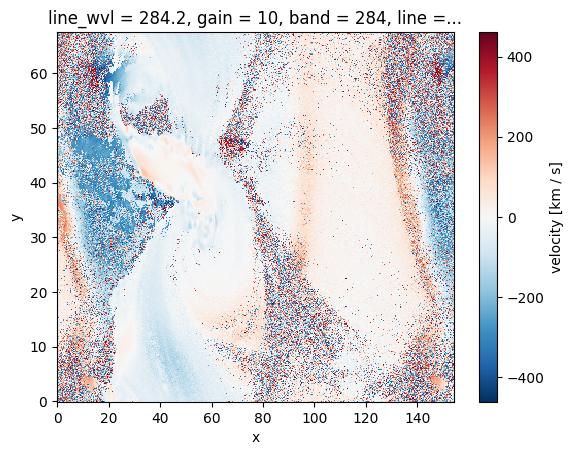

In [77]:
mom_only_core.velocity.isel(line=1).plot()

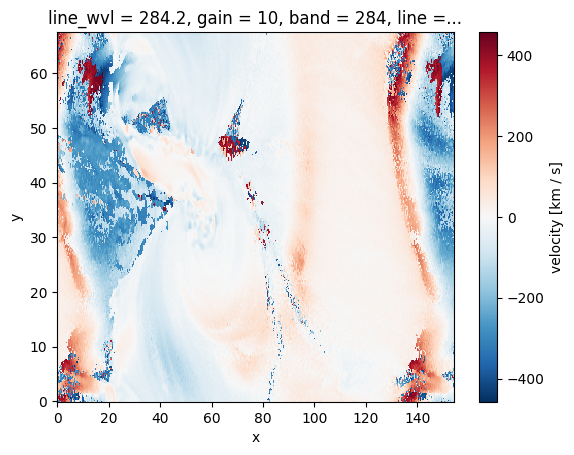

In [78]:
mom_diff_removed.velocity.isel(line=1).plot()

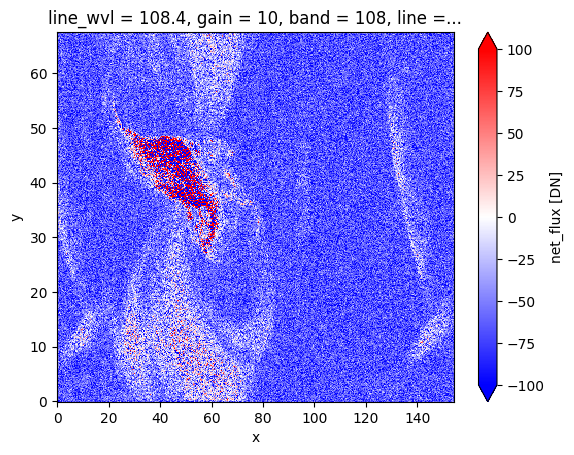

In [86]:
(mom_diff_removed-mom_only_core).net_flux.isel(line=2).plot(vmin=-100, vmax=100, cmap='bwr')

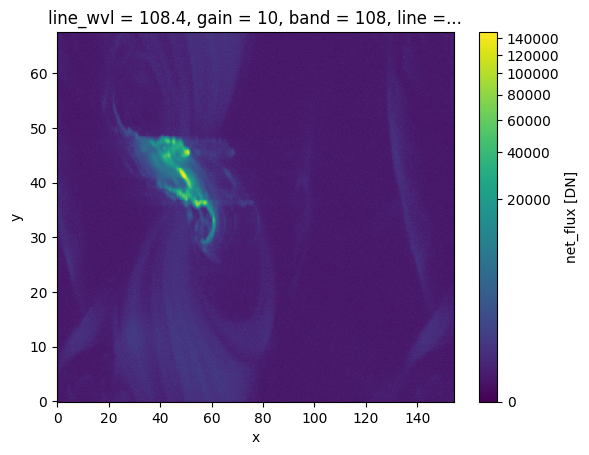

In [88]:
(mom_diff).net_flux.isel(line=2).plot(norm=pn)

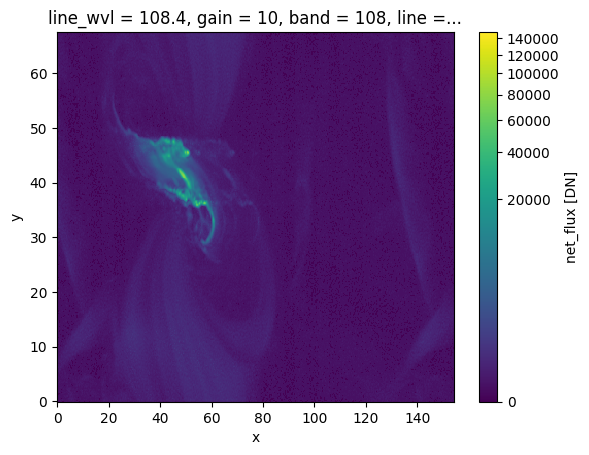

In [89]:
(mom_diff_removed).net_flux.isel(line=2).plot(norm=pn)